Importar Bibliotecas

In [16]:
# Importação de bibliotecas padrão
import os

# Importação de bibliotecas de terceiros
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

Lista de diretório de dados

In [17]:
# Lista de diretório de dados
diretorio_de_dados = os.path.join(os.getcwd())
arquivos = os.listdir(diretorio_de_dados)
print(arquivos)

['.git', '.gitattributes', 'predictive-maintenance.zip', 'Projeto_Dados_de_Producao.ipynb', 'README.md']


Definição das Colunas e Inicialização do Dicionário

In [9]:
# Definição das colunas
config_operacional = [f'config_op_{i+1}' for i in range(3)]
medicao_sensor = [f'med_sensor{i+1}' for i in range(26)]
dados = ['numero_motor', 'tempo_ciclos']
lista_colunas = dados + config_operacional + medicao_sensor

# Inicializar o dicionário para armazenar os DataFrames
dicionario = {}

Carregamento dos Dados de Treinamento, Teste e RUL

In [10]:
# lista_treino e processamento aqui
lista_treino = [x for x in sorted(os.listdir(diretorio_de_dados)) if 'train' in x]

for treino in lista_treino:
    data_set_name = treino.replace('train_', '').replace('.txt', '')
    teste = 'test_' + data_set_name + '.txt'
    rul_teste = 'RUL_' + data_set_name + '.txt'
    
    dicionario[data_set_name] = {
        'df_treino': pd.read_csv(os.path.join(diretorio_de_dados, treino), sep=' ', names=lista_colunas),
        'df_teste': pd.read_csv(os.path.join(diretorio_de_dados, teste), sep=' ', names=lista_colunas),
        'RUL_teste' :pd.read_csv(os.path.join(diretorio_de_dados, rul_teste), names=['RUL']),
    }

Cálculo do RUL para os Dados de Treinamento

In [11]:
# Aplicar a função add_rul para todos os conjuntos de dados
for dado in dicionario:
    dicionario[dado]['df_treino']['RUL'] = dicionario[dado]['df_treino'].groupby('numero_motor')['tempo_ciclos'].transform(lambda x: x.max() - x)
    dicionario[dado]['df_treino'] = dicionario[dado]['df_treino'].reset_index(drop=True)
    dicionario[dado]['df_treino'] = dicionario[dado]['df_treino'].dropna(axis=1, how='all')

       numero_motor  tempo_ciclos   config_op_1   config_op_2   config_op_3  \
count  61249.000000  61249.000000  61249.000000  61249.000000  61249.000000   
mean     124.325181    134.311417     23.999823      0.571347     94.031576   
std       71.995350     89.783389     14.780722      0.310703     14.251954   
min        1.000000      1.000000      0.000000      0.000000     60.000000   
25%       60.000000     62.000000     10.004600      0.250700    100.000000   
50%      126.000000    123.000000     25.001400      0.700000    100.000000   
75%      185.000000    191.000000     41.998100      0.840000    100.000000   
max      249.000000    543.000000     42.008000      0.842000    100.000000   

        med_sensor1   med_sensor2   med_sensor3   med_sensor4   med_sensor5  \
count  61249.000000  61249.000000  61249.000000  61249.000000  61249.000000   
mean     472.882435    579.420056   1417.896600   1201.915359      8.031626   
std       26.436832     37.342647    106.167598    

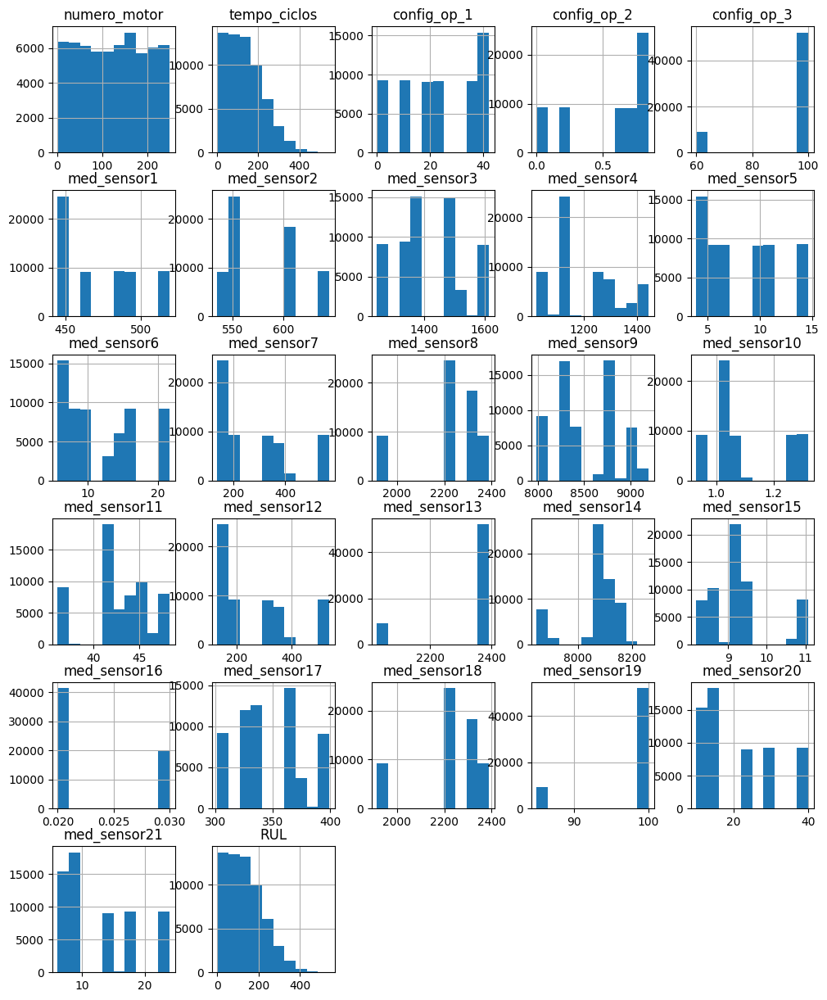

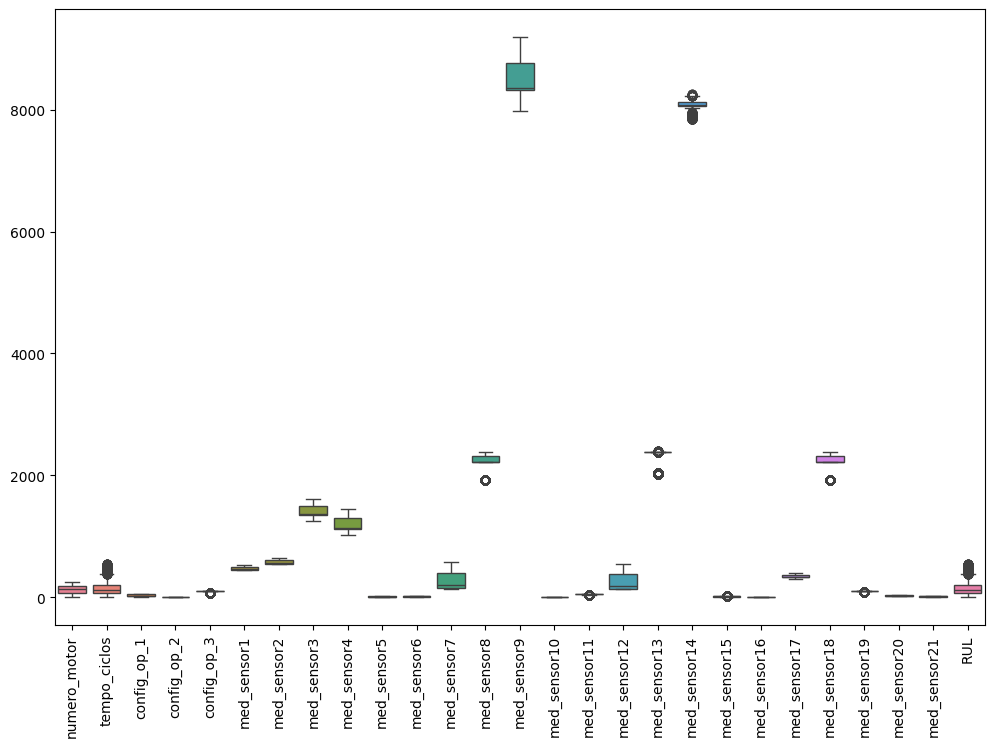

In [12]:
tabela_treino = dicionario[dado]['df_treino']

# Estatísticas descritivas
print( tabela_treino.describe())

# Histograma
tabela_treino.hist(figsize=(12, 15))
plt.show()

# Boxplot para detectar outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=tabela_treino)
plt.xticks(rotation=90)
plt.show()

Remoção de Outliers

In [13]:
def remove_outliers(df, column):
    # Calcula o primeiro e o terceiro quartis (Q1 e Q3)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Definir limites inferior e superior
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filtrar os dados para remover outliers
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df_filtered

# Aplicar a função de remoção de outliers para as colunas de interesse
for dado in dicionario:
    for coluna in dicionario[dado]['df_treino'].columns:
        if dicionario[dado]['df_treino'][coluna].dtype in [np.float64, np.int64]:
            dicionario[dado]['df_treino'] = remove_outliers(dicionario[dado]['df_treino'], coluna)

Preparação dos Dados e Treinamento do Modelo

In [14]:
# Selecionar um conjunto de dados para treinamento e validação
train_df = dicionario['FD001']['df_treino']
test_df = dicionario['FD001']['df_teste']

# Remover colunas desnecessárias do conjunto de treinamento e teste
X_train = train_df.drop(['RUL', 'tempo_ciclos', 'numero_motor'], axis=1)
y_train = train_df['RUL']
X_test = test_df.drop(['tempo_ciclos', 'numero_motor'], axis=1)

# Verificar e ajustar colunas faltantes no conjunto de teste
missing_cols = set(X_train.columns) - set(X_test.columns)
for col in missing_cols:
    X_test[col] = np.nan  # Adicionar colunas faltantes com NaN

# Remover colunas extras do conjunto de teste
extra_cols = set(X_test.columns) - set(X_train.columns)
X_test.drop(extra_cols, axis=1, inplace=True)

# Reordenar as colunas para garantir a mesma ordem
X_test = X_test[X_train.columns]

# Normalização dos dados
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Dividir os dados em conjuntos de treinamento e validação
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train_scaled, y_train, test_size=0.2, random_state=42)

# Definir a grade de hiperparâmetros
param_grid = {
    'n_estimators': [500],
    'max_depth': [8, 10],
    'min_samples_split': [8, 10],
    'min_samples_leaf': [6, 8],
    'bootstrap': [True]
}

# Inicializar o GridSearchCV
rf_model = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Treinar o modelo com os melhores parâmetros
grid_search.fit(X_train_split, y_train_split)

# Verificar os melhores parâmetros
print("Melhores parâmetros encontrados: ", grid_search.best_params_)

# Avaliar o desempenho no conjunto de validação
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_val_split)
rmse = np.sqrt(mean_squared_error(y_val_split, y_pred))

print(f'Validation RMSE: {rmse}')

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Melhores parâmetros encontrados:  {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 500}
Validation RMSE: 41.81216247715364


Previsão do conjuto de teste

In [28]:
# Previsões para o conjunto de teste
y_test_pred = best_rf_model.predict(X_test_scaled)

# Verificar se a coluna 'numero_motor' está presente para a submissão
if 'numero_motor' in test_df.columns:
    submission = pd.DataFrame({'numero_motor': test_df['numero_motor'], 'RUL': y_test_pred})
else:
    submission = pd.DataFrame({'RUL': y_test_pred})

submission.to_csv('submission.csv', index=False)

Visualização da importância das features

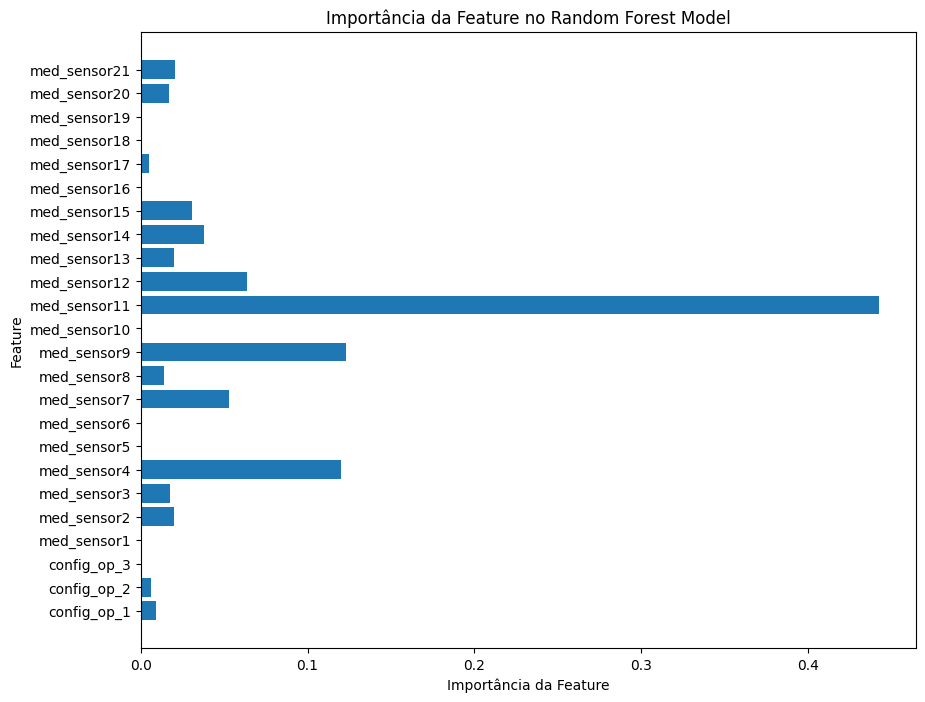

In [15]:
# Visualização da importância das características
importancia = best_rf_model.feature_importances_
features = X_train.columns

plt.figure(figsize=(10, 8))
plt.barh(features, importancia)
plt.xlabel("Importância da Feature")
plt.ylabel("Feature")
plt.title("Importância da Feature no Random Forest Model")
plt.show()

Plot a temporal vizualisation of the features

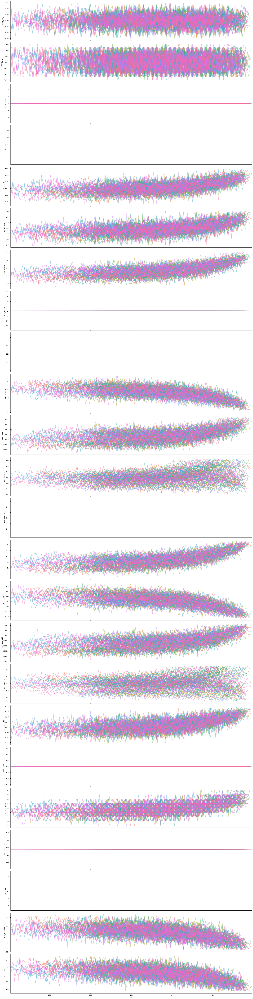

In [30]:
# Filtrar as colunas que começam com 'med_sensor'
sensor_columns = [col for col in train_df.columns if col.startswith('med_sensor') or col.startswith('config_')]

# Copiar e ordenar o DataFrame
df_plot = train_df.copy().sort_values(dados)

# Criar o PairGrid com as colunas filtradas
graph = sns.PairGrid(data=df_plot, x_vars=["RUL"], y_vars=sensor_columns, hue="numero_motor", height=4, aspect=6)

# Mapear a função de plotagem (plotar uma linha)
graph = graph.map(plt.plot, alpha=0.5)

# Configurar os limites do eixo x para inverter a ordem (RUL decrescente)
graph = graph.set(xlim=(df_plot['RUL'].max(), df_plot['RUL'].min()))

# Mostrar o gráfico
plt.show()